# Remove outliers

In [30]:
import pandas 
import numpy as np
import scipy.special
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
import math
import joblib
import matplotlib.pyplot as plt



### Load Data

In [31]:
X_aligned_list = joblib.load('../data/interim/01_X_aligned_list.joblib')
y_aligned_list = joblib.load('../data/interim/02_y_aligned_list.joblib')


### 1. IQR

In [32]:
def compute_iqr_bounds(series, threshold=1.5):
    """
    Computes lower and upper bounds for IQR-based outlier detection.

    Args:
        series (pd.Series): The data column to analyze.
        threshold (float): The IQR multiplier (default 1.5).

    Returns:
        (float, float): Lower and upper bounds.
    """
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return lower_bound, upper_bound


In [33]:
def print_summary_iqr(X_list, threshold=1.5):
    for i, df in enumerate(X_list):
        print(f"\nLab {i + 1} - Outlier Detection (IQR x {threshold})")
        overall_outlier_mask = np.zeros(len(df), dtype=bool)

        for col in df.columns:
            if col != 'Time':
                lower, upper = compute_iqr_bounds(df[col], threshold)
                outlier_mask = (df[col] < lower) | (df[col] > upper)
                overall_outlier_mask |= outlier_mask
                outlier_count = outlier_mask.sum()
                print(f"  {col}: {outlier_count} outliers")

        total_rows_with_any_outlier = overall_outlier_mask.sum()
        print(f" \nTotal rows with at least one outlier: {total_rows_with_any_outlier} / {len(df)}")
        print("-" * 40)


In [34]:
print_summary_iqr(X_aligned_list, threshold=1.5)


Lab 1 - Outlier Detection (IQR x 1.5)
  1_red: 1870 outliers
  1_blue: 3614 outliers
  1_yellow: 1697 outliers
  2_red: 9 outliers
  2_blue: 931 outliers
  2_yellow: 7294 outliers
  3_red: 0 outliers
  3_blue: 584 outliers
  3_yellow: 0 outliers
  4_red: 3412 outliers
  4_blue: 2825 outliers
  4_yellow: 1176 outliers
  5_red: 2207 outliers
  5_blue: 2295 outliers
  5_yellow: 70 outliers
  6_red: 0 outliers
  6_blue: 0 outliers
  6_yellow: 0 outliers
 
Total rows with at least one outlier: 9309 / 63504
----------------------------------------

Lab 2 - Outlier Detection (IQR x 1.5)
  1_red: 8152 outliers
  1_blue: 9390 outliers
  1_yellow: 3401 outliers
  2_red: 0 outliers
  2_blue: 2906 outliers
  2_yellow: 7427 outliers
  3_red: 3648 outliers
  3_blue: 1738 outliers
  3_yellow: 2505 outliers
  4_red: 3947 outliers
  4_blue: 9619 outliers
  4_yellow: 4909 outliers
  5_red: 4413 outliers
  5_blue: 2452 outliers
  5_yellow: 2119 outliers
  6_red: 8299 outliers
  6_blue: 14727 outliers
  

In [35]:
def visualize_outliers_iqr(X_list, threshold=1.5, cols_per_row=3):
    """
    Visualizes outliers for every feature in every lab using the IQR method.

    Args:
        X_list (list): List of DataFrames (one per lab).
        threshold (float): The multiplier for the IQR (default is 1.5).
        cols_per_row (int): Number of subplots per row.
    """
    for i, df in enumerate(X_list):
        print(f"\nLab {i + 1} - Outlier Visualization (IQR x {threshold})")
        
        feature_cols = [col for col in df.columns if col != 'Time']
        num_features = len(feature_cols)
        rows = (num_features + cols_per_row - 1) // cols_per_row
        
        fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 4 * rows))
        axes = axes.flatten()

        for idx, feature in enumerate(feature_cols):
            lower_bound, upper_bound = compute_iqr_bounds(df[feature], threshold)
            outlier_mask = (df[feature] < lower_bound) | (df[feature] > upper_bound)
            inlier_mask = ~outlier_mask

            # Plot to subplot
            axes[idx].scatter(df.index[inlier_mask], df.loc[inlier_mask, feature], s=2, c='blue', label='Inliers')
            axes[idx].scatter(df.index[outlier_mask], df.loc[outlier_mask, feature], s=2, c='red', label='Outliers')
            axes[idx].set_title(f"{feature}")
            axes[idx].set_xlabel('Samples')
            axes[idx].set_ylabel('Value')

        # Hide unused subplots if any
        for idx in range(len(feature_cols), len(axes)):
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()


Lab 1 - Outlier Visualization (IQR x 1.5)


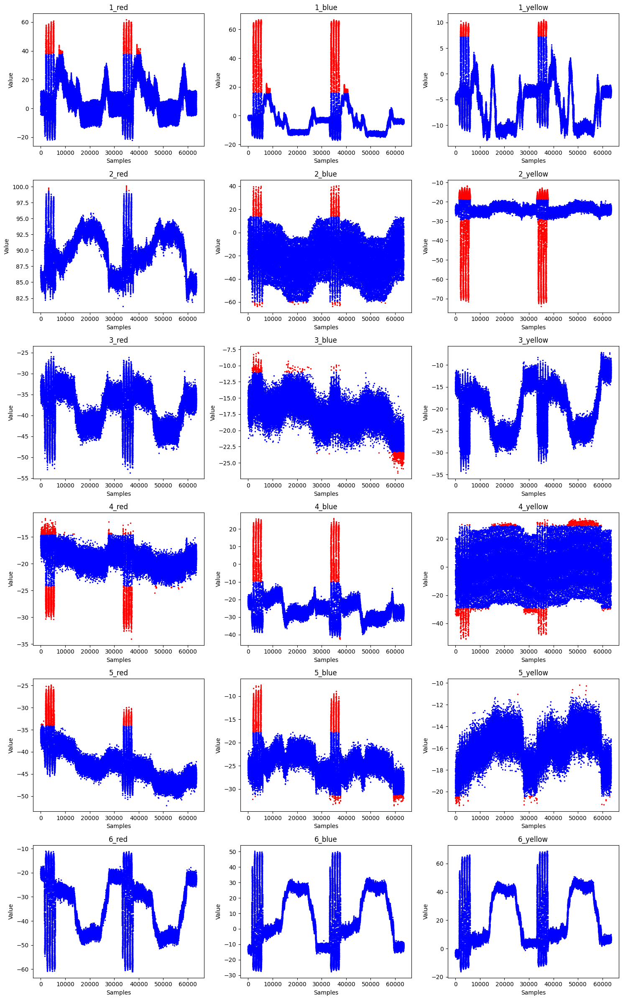


Lab 2 - Outlier Visualization (IQR x 1.5)


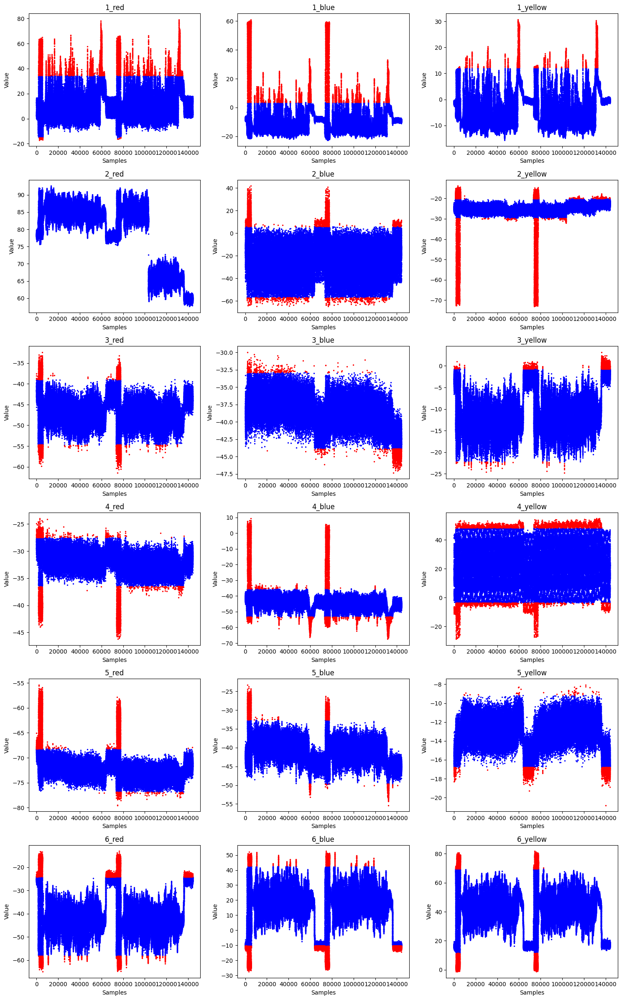


Lab 3 - Outlier Visualization (IQR x 1.5)


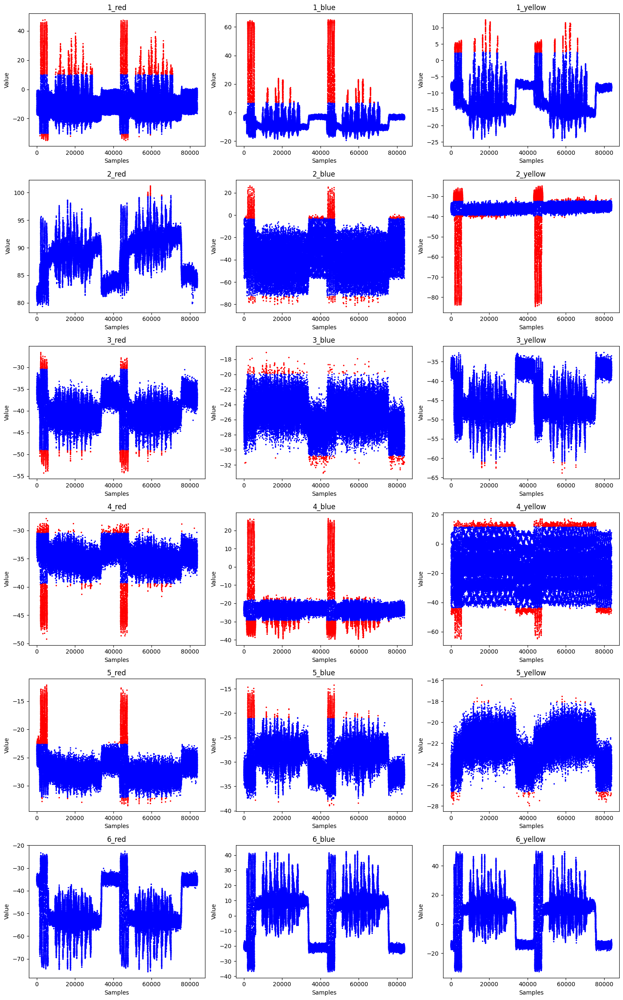


Lab 4 - Outlier Visualization (IQR x 1.5)


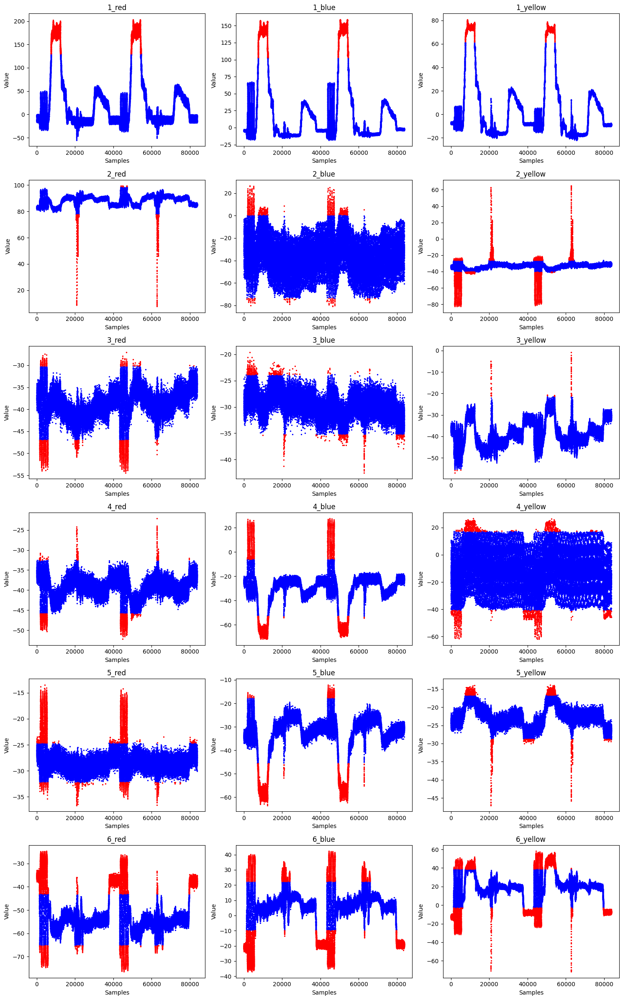

In [36]:
visualize_outliers_iqr(X_aligned_list, threshold=1.5)


### 2. Chauvenet's criterion 

In [37]:
def compute_chauvenet_outliers(df, feature_cols, C=2):
    
    outlier_matrix = np.zeros((len(df), len(feature_cols)), dtype=bool)
    
    for j, feature in enumerate(feature_cols):
        mean = df[feature].mean()
        std = df[feature].std()
        N = len(df)
        criterion = 1.0 / (C * N)
        deviation = abs(df[feature] - mean) / std
        low = -deviation / math.sqrt(C)
        high = deviation / math.sqrt(C)
        prob = 1.0 - 0.5 * (scipy.special.erf(high) - scipy.special.erf(low))
        outlier_matrix[:, j] = prob < criterion
        
    return outlier_matrix


In [38]:
def print_summary_chauvenet(X_list, C=2):
    for i, df in enumerate(X_list):
        print(f"\nLab {i + 1} - Outlier Detection (Chauvenet's Criterion, C={C})")
        feature_cols = [col for col in df.columns if col != 'Time']

        # Compute Chauvenet outlier matrix
        outlier_matrix = compute_chauvenet_outliers(df, feature_cols, C)

        # Report per feature
        for j, col in enumerate(feature_cols):
            print(f"  {col}: {outlier_matrix[:, j].sum()} outliers")

        # Report intersected rows
        total_rows_with_multi_outliers = np.sum(np.sum(outlier_matrix, axis=1) >= 1)
        print(f"\n  Total rows with at least 1 outlier: {total_rows_with_multi_outliers} / {len(df)}")
        print("-" * 40)



In [39]:
def visualize_outliers_chauvenet(X_list, C=2, cols_per_row=3):
    """
    Batch plot Chauvenet's criterion outliers for all labs.
    
    Args:
        X_list (list): List of DataFrames, one per lab.
        C (int): Chauvenet's criterion threshold.
        cols_per_row (int): Number of subplots per row.
    """
    for i, df in enumerate(X_list):
        print(f"\nLab {i + 1} - Chauvenet's Criterion Outlier Visualization (C={C})")
        feature_cols = [col for col in df.columns if col != 'Time']
        outlier_matrix = compute_chauvenet_outliers(df, feature_cols, C)

        num_features = len(feature_cols)
        rows = (num_features + cols_per_row - 1) // cols_per_row
        fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 4 * rows))
        axes = axes.flatten()

        for idx, feature in enumerate(feature_cols):
            outlier_mask = outlier_matrix[:, idx]
            inlier_mask = ~outlier_mask
            axes[idx].scatter(df.index[inlier_mask], df.loc[inlier_mask, feature], s=2, c='blue', label='Inliers')
            axes[idx].scatter(df.index[outlier_mask], df.loc[outlier_mask, feature], s=2, c='red', label='Outliers')
            axes[idx].set_title(feature)
            axes[idx].set_xlabel('Samples')
            axes[idx].set_ylabel('Value')

        for idx in range(len(feature_cols), len(axes)):
            axes[idx].axis('off')
        plt.tight_layout()
        plt.show()


In [40]:
print_summary_chauvenet(X_aligned_list, C=2)


Lab 1 - Outlier Detection (Chauvenet's Criterion, C=2)
  1_red: 0 outliers
  1_blue: 945 outliers
  1_yellow: 0 outliers
  2_red: 0 outliers
  2_blue: 0 outliers
  2_yellow: 1371 outliers
  3_red: 0 outliers
  3_blue: 0 outliers
  3_yellow: 0 outliers
  4_red: 130 outliers
  4_blue: 975 outliers
  4_yellow: 0 outliers
  5_red: 6 outliers
  5_blue: 175 outliers
  5_yellow: 0 outliers
  6_red: 0 outliers
  6_blue: 0 outliers
  6_yellow: 0 outliers

  Total rows with at least 1 outlier: 1416 / 63504
----------------------------------------

Lab 2 - Outlier Detection (Chauvenet's Criterion, C=2)
  1_red: 84 outliers
  1_blue: 1809 outliers
  1_yellow: 394 outliers
  2_red: 0 outliers
  2_blue: 40 outliers
  2_yellow: 2248 outliers
  3_red: 1 outliers
  3_blue: 0 outliers
  3_yellow: 0 outliers
  4_red: 1088 outliers
  4_blue: 1805 outliers
  4_yellow: 0 outliers
  5_red: 1689 outliers
  5_blue: 94 outliers
  5_yellow: 1 outliers
  6_red: 0 outliers
  6_blue: 0 outliers
  6_yellow: 0 outli


Lab 1 - Chauvenet's Criterion Outlier Visualization (C=2)


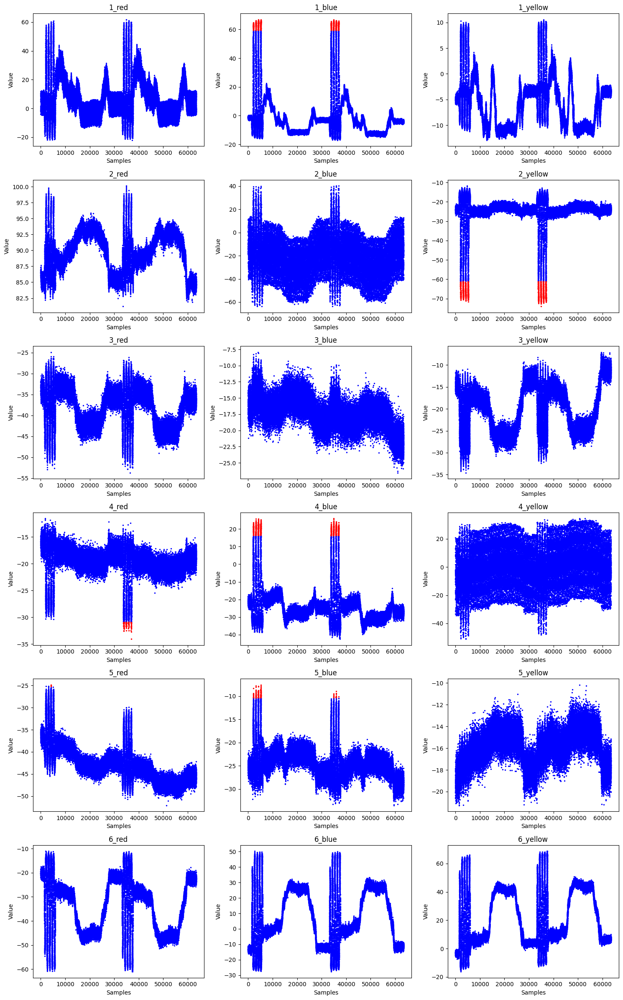


Lab 2 - Chauvenet's Criterion Outlier Visualization (C=2)


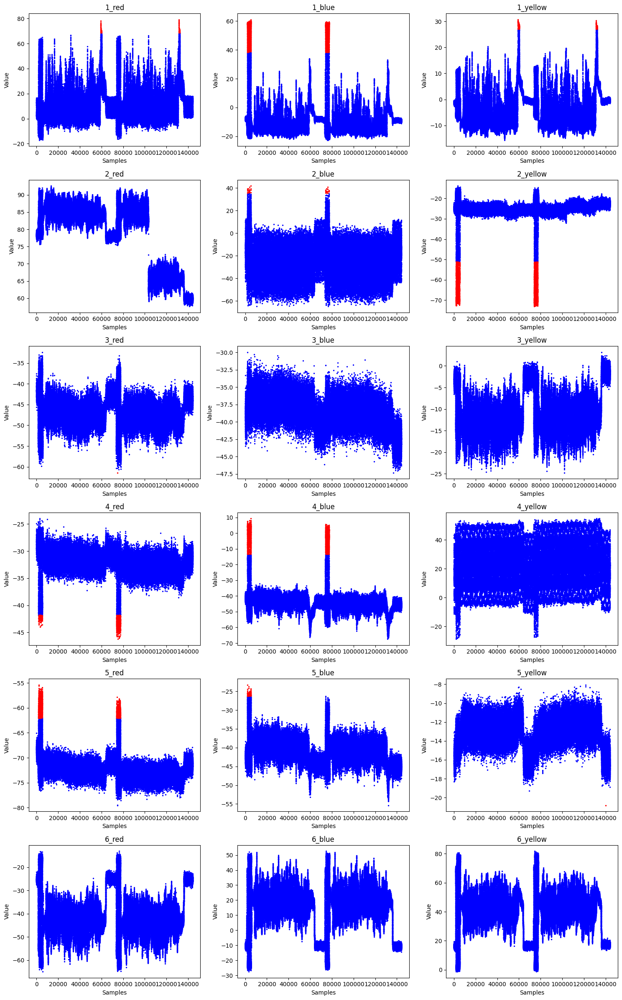


Lab 3 - Chauvenet's Criterion Outlier Visualization (C=2)


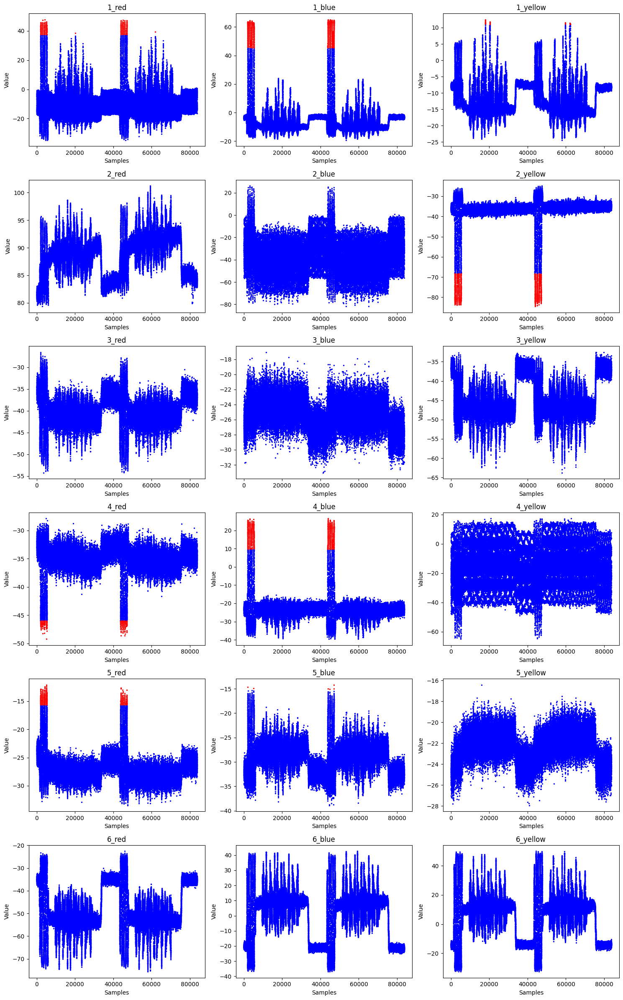


Lab 4 - Chauvenet's Criterion Outlier Visualization (C=2)


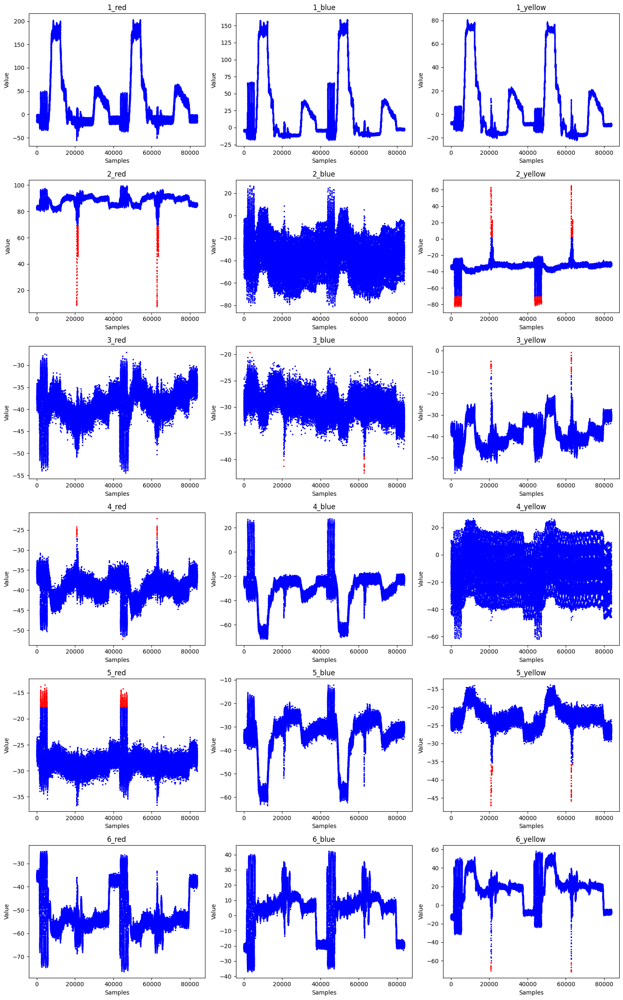

In [41]:
visualize_outliers_chauvenet(X_aligned_list, C=2, cols_per_row=3)

### 3. Local outlier factor

In [42]:
def mark_outliers_lof(dataset, columns, n=20):
    """
    Marks outliers using Local Outlier Factor (LOF).
    
    Args:
        dataset (pd.DataFrame): The dataset to check.
        columns (list): List of feature columns to use for LOF.
        n (int): Number of neighbors (default 20).

    Returns:
        np.ndarray: Boolean array where True indicates an outlier.
    """
    lof = LocalOutlierFactor(n_neighbors=n)
    outlier_flags = lof.fit_predict(dataset[columns])
    outlier_mask = outlier_flags == -1  # True for outliers
    return outlier_mask


In [43]:
def print_summary_lof(X_list, n_neighbors=20):
    for i, df in enumerate(X_list):
        print(f"\nLab {i + 1} - Outlier Detection (LOF, n_neighbors={n_neighbors})")
        feature_cols = [col for col in df.columns if col != 'Time']

        # Compute LOF outlier mask
        lof_outlier_mask = mark_outliers_lof(df, feature_cols, n_neighbors)

        for col in feature_cols:
            print(f"  {col}: {lof_outlier_mask.sum()}")

        # Report intersected rows (same as LOF mask)
        print(f"\n  Total rows with LOF outlier flag: {lof_outlier_mask.sum()} / {len(df)}")
        print("-" * 40)


In [44]:
def visualize_outliers_lof(X_list, n_neighbors=20, cols_per_row=3):
    """
    Batch plot LOF outliers for all labs.
    
    Args:
        X_list (list): List of DataFrames, one per lab.
        n_neighbors (int): Number of neighbors for LOF.
        cols_per_row (int): Number of subplots per row.
    """
    for i, df in enumerate(X_list):
        print(f"\nLab {i + 1} - LOF Outlier Visualization (n_neighbors={n_neighbors})")
        feature_cols = [col for col in df.columns if col != 'Time']
        lof_outlier_mask = mark_outliers_lof(df, feature_cols, n=n_neighbors)

        num_features = len(feature_cols)
        rows = (num_features + cols_per_row - 1) // cols_per_row
        fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 4 * rows))
        axes = axes.flatten()

        for idx, feature in enumerate(feature_cols):
            inlier_mask = ~lof_outlier_mask
            axes[idx].scatter(df.index[inlier_mask], df.loc[inlier_mask, feature], s=2, c='blue', label='Inliers')
            axes[idx].scatter(df.index[lof_outlier_mask], df.loc[lof_outlier_mask, feature], s=2, c='red', label='Outliers')
            axes[idx].set_title(feature)
            axes[idx].set_xlabel('Samples')
            axes[idx].set_ylabel('Value')

        for idx in range(len(feature_cols), len(axes)):
            axes[idx].axis('off')
        plt.tight_layout()
        plt.show()


In [45]:
# Run Local Outlier Factor
print_summary_lof(X_aligned_list, n_neighbors=10)



Lab 1 - Outlier Detection (LOF, n_neighbors=10)
  1_red: 109
  1_blue: 109
  1_yellow: 109
  2_red: 109
  2_blue: 109
  2_yellow: 109
  3_red: 109
  3_blue: 109
  3_yellow: 109
  4_red: 109
  4_blue: 109
  4_yellow: 109
  5_red: 109
  5_blue: 109
  5_yellow: 109
  6_red: 109
  6_blue: 109
  6_yellow: 109

  Total rows with LOF outlier flag: 109 / 63504
----------------------------------------

Lab 2 - Outlier Detection (LOF, n_neighbors=10)
  1_red: 136
  1_blue: 136
  1_yellow: 136
  2_red: 136
  2_blue: 136
  2_yellow: 136
  3_red: 136
  3_blue: 136
  3_yellow: 136
  4_red: 136
  4_blue: 136
  4_yellow: 136
  5_red: 136
  5_blue: 136
  5_yellow: 136
  6_red: 136
  6_blue: 136
  6_yellow: 136

  Total rows with LOF outlier flag: 136 / 144144
----------------------------------------

Lab 3 - Outlier Detection (LOF, n_neighbors=10)
  1_red: 66
  1_blue: 66
  1_yellow: 66
  2_red: 66
  2_blue: 66
  2_yellow: 66
  3_red: 66
  3_blue: 66
  3_yellow: 66
  4_red: 66
  4_blue: 66
  4_yellow:


Lab 1 - LOF Outlier Visualization (n_neighbors=10)


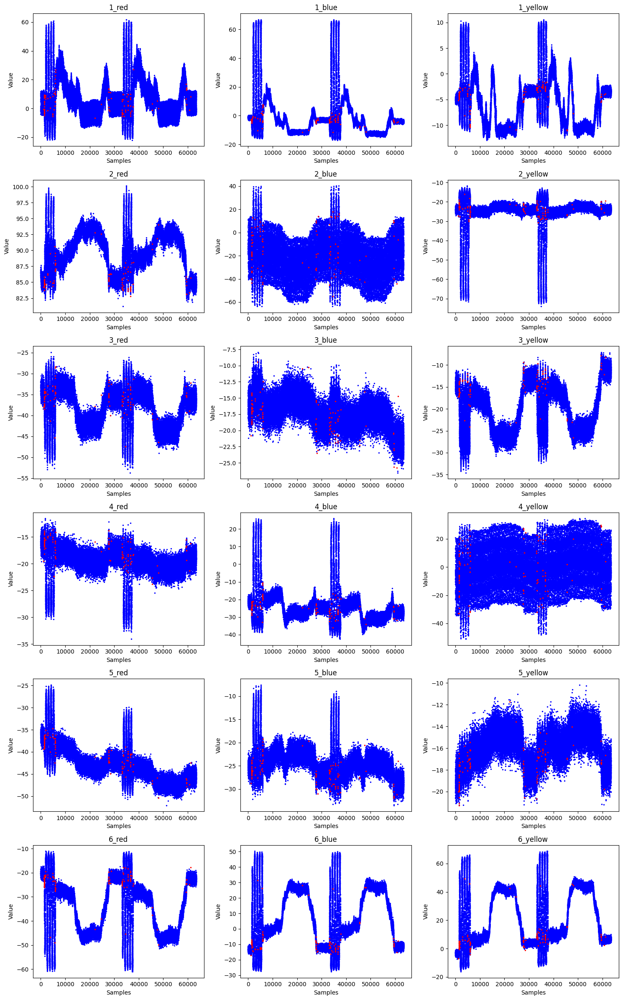


Lab 2 - LOF Outlier Visualization (n_neighbors=10)


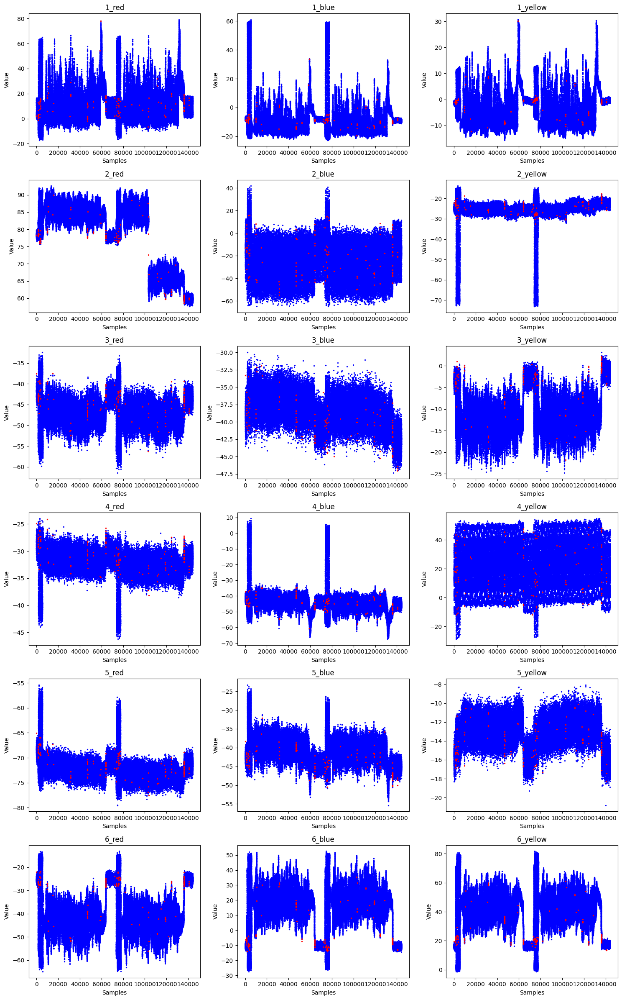


Lab 3 - LOF Outlier Visualization (n_neighbors=10)


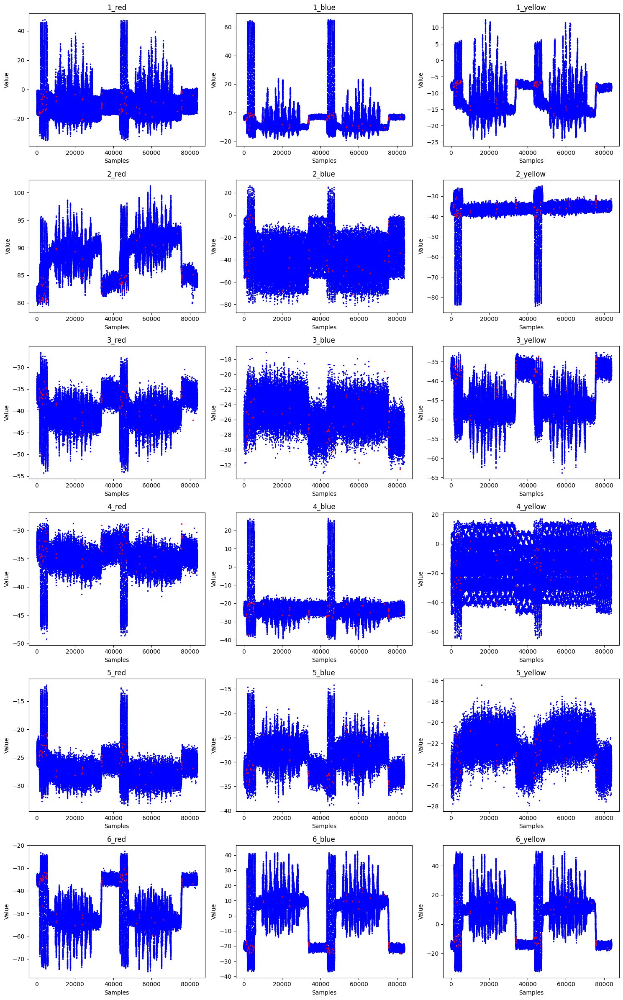


Lab 4 - LOF Outlier Visualization (n_neighbors=10)


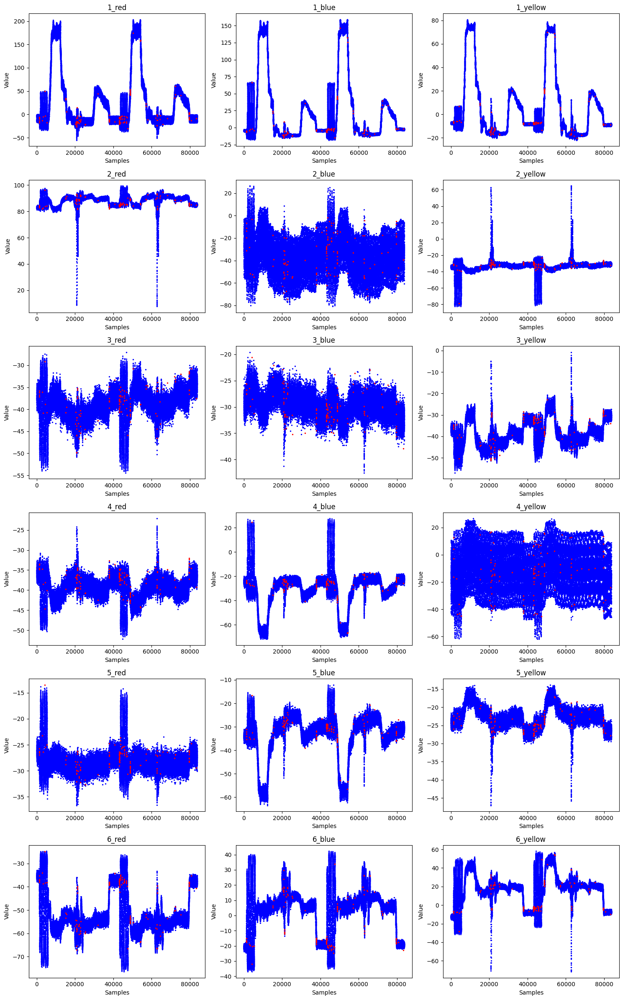

In [46]:
visualize_outliers_lof(X_aligned_list, n_neighbors=10, cols_per_row=3)

### 4. Isolation forest

In [47]:
def mark_outliers_isolation_forest(dataset, feature_cols, n_estimators=100, contamination='auto', random_state=None):
    """
    Marks outliers using Isolation Forest.

    Args:
        dataset (pd.DataFrame): The dataset to check.
        feature_cols (list): List of feature columns to use.
        n_estimators (int): Number of trees in the forest (default 100).
        contamination (str or float): Proportion of outliers (default 'auto').
        random_state (int or None): Random seed for reproducibility.

    Returns:
        np.ndarray: Boolean array where True indicates an outlier.
    """
    iso_forest = IsolationForest(n_estimators=n_estimators, contamination=contamination, random_state=random_state)
    outlier_flags = iso_forest.fit_predict(dataset[feature_cols])
    outlier_mask = outlier_flags == -1  # -1 indicates outlier
    return outlier_mask

In [48]:
def print_summary_isolation_forest(X_list, n_estimators=100, contamination='auto'):
    for i, df in enumerate(X_list):
        print(f"\nLab {i + 1} - Isolation Forest Outlier Detection (n_estimators={n_estimators}, contamination={contamination})")
        feature_cols = [col for col in df.columns if col != 'Time']
        
        outlier_mask = mark_outliers_isolation_forest(df, feature_cols, n_estimators, contamination)
        print(f"  Total outliers detected: {outlier_mask.sum()} / {len(df)}")
        print("-" * 40)


In [49]:
def visualize_outliers_isolation_forest(X_list, n_estimators=100, contamination='auto', cols_per_row=3):
    """
    Batch plot Isolation Forest outliers for all labs.
    
    Args:
        X_list (list): List of DataFrames, one per lab.
        n_estimators (int): Number of trees in the forest.
        contamination (str or float): Proportion of outliers.
        cols_per_row (int): Number of subplots per row.
    """
    for i, df in enumerate(X_list):
        print(f"\nLab {i + 1} - Isolation Forest Outlier Visualization (n_estimators={n_estimators}, contamination={contamination})")
        feature_cols = [col for col in df.columns if col != 'Time']
        outlier_mask = mark_outliers_isolation_forest(df, feature_cols, n_estimators, contamination)

        num_features = len(feature_cols)
        rows = (num_features + cols_per_row - 1) // cols_per_row
        fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 4 * rows))
        axes = axes.flatten()

        for idx, feature in enumerate(feature_cols):
            inlier_mask = ~outlier_mask
            axes[idx].scatter(df.index[inlier_mask], df.loc[inlier_mask, feature], s=2, c='blue', label='Inliers')
            axes[idx].scatter(df.index[outlier_mask], df.loc[outlier_mask, feature], s=2, c='red', label='Outliers')
            axes[idx].set_title(feature)
            axes[idx].set_xlabel('Samples')
            axes[idx].set_ylabel('Value')

        for idx in range(len(feature_cols), len(axes)):
            axes[idx].axis('off')
        plt.tight_layout()
        plt.show()

In [50]:
# Run Isolation Forest summary for all labs
print_summary_isolation_forest(X_aligned_list, n_estimators=500, contamination=0.05)


Lab 1 - Isolation Forest Outlier Detection (n_estimators=500, contamination=0.05)
  Total outliers detected: 3176 / 63504
----------------------------------------

Lab 2 - Isolation Forest Outlier Detection (n_estimators=500, contamination=0.05)
  Total outliers detected: 7208 / 144144
----------------------------------------

Lab 3 - Isolation Forest Outlier Detection (n_estimators=500, contamination=0.05)
  Total outliers detected: 4184 / 83664
----------------------------------------

Lab 4 - Isolation Forest Outlier Detection (n_estimators=500, contamination=0.05)
  Total outliers detected: 4184 / 83664
----------------------------------------



Lab 1 - Isolation Forest Outlier Visualization (n_estimators=500, contamination=0.05)


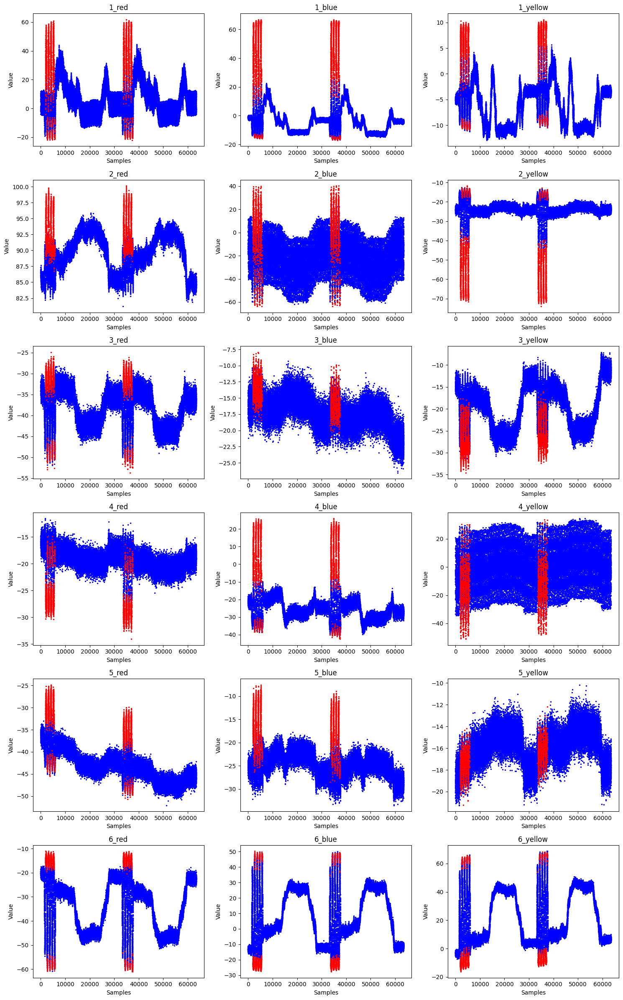


Lab 2 - Isolation Forest Outlier Visualization (n_estimators=500, contamination=0.05)


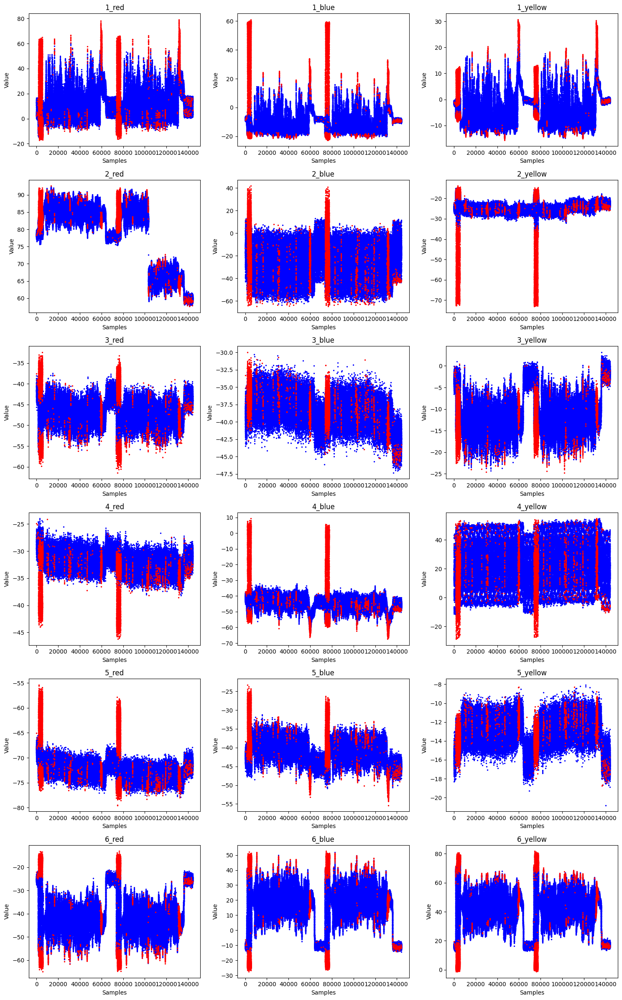


Lab 3 - Isolation Forest Outlier Visualization (n_estimators=500, contamination=0.05)


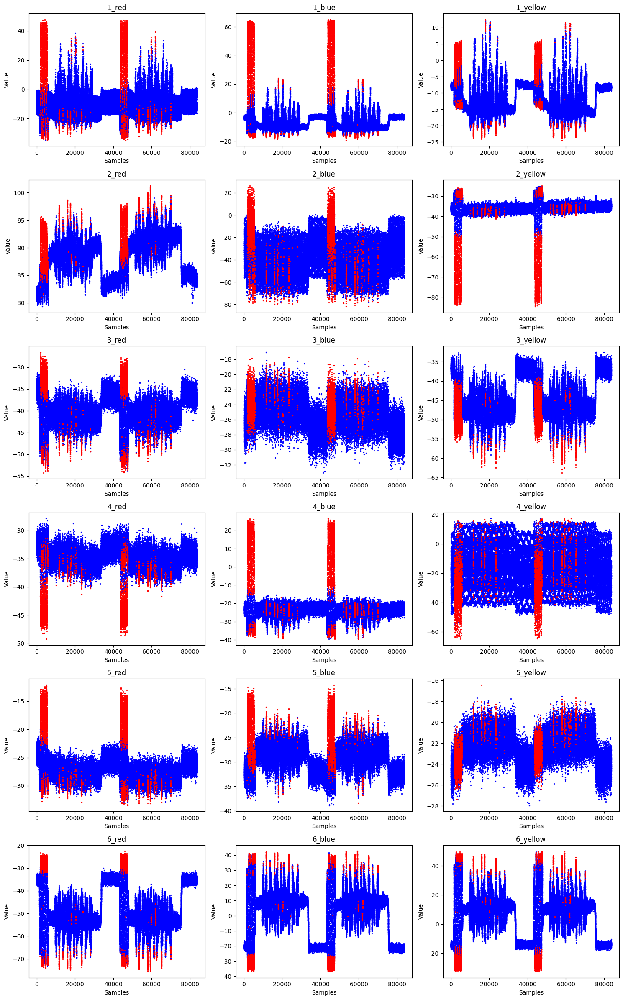


Lab 4 - Isolation Forest Outlier Visualization (n_estimators=500, contamination=0.05)


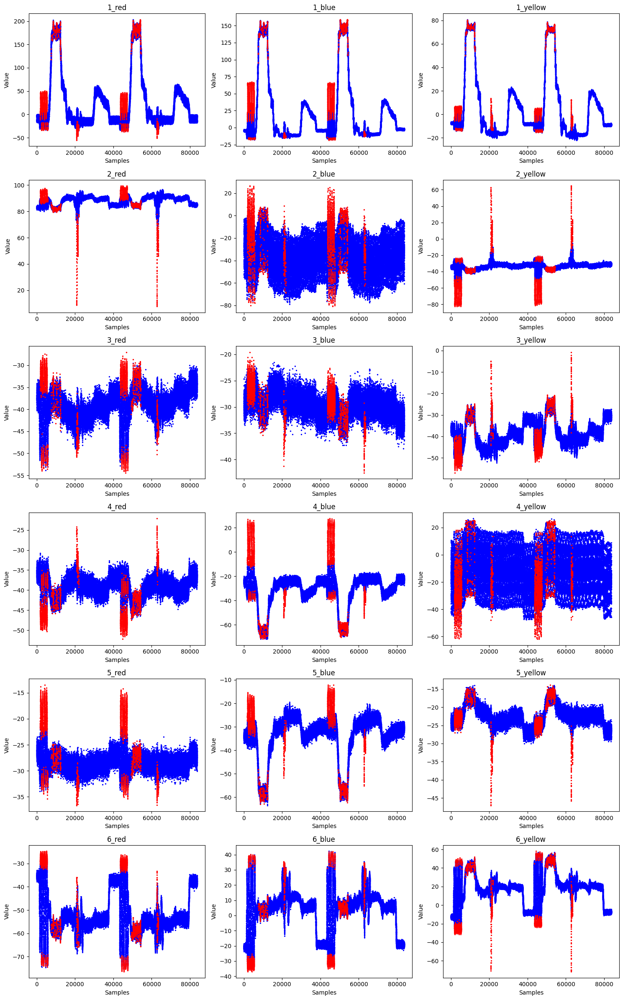

In [51]:
# Visualize Isolation Forest outliers for all labs
visualize_outliers_isolation_forest(X_aligned_list, n_estimators=500, contamination=0.05, cols_per_row=3)


### Remove outliers using isolation forest



In [52]:
def remove_outliers_isolation_forest(X_list, y_list, n_estimators=100, contamination=0.05):
    """
    Removes rows identified as outliers in X_list, and applies the same removal to y_list.
    
    Args:
        X_list (list): List of feature DataFrames.
        y_list (list): List of label DataFrames (aligned with X_list).
        n_estimators (int): Number of estimators for Isolation Forest.
        contamination (float): Proportion of expected outliers.

    Returns:
        cleaned_X_list, cleaned_y_list: Lists of cleaned DataFrames.
    """
    cleaned_X_list = []
    cleaned_y_list = []

    for i, (X_df, y_df) in enumerate(zip(X_list, y_list)):
        print(f"Removing outliers from Lab {i + 1}...")

        feature_cols = [col for col in X_df.columns if col != 'Time']
        outlier_mask = mark_outliers_isolation_forest(X_df, feature_cols, n_estimators, contamination)

        X_cleaned = X_df[~outlier_mask].reset_index(drop=True)
        y_cleaned = y_df[~outlier_mask].reset_index(drop=True)

        print(f"  Removed {outlier_mask.sum()} outliers, remaining {len(X_cleaned)} samples.\n")

        cleaned_X_list.append(X_cleaned)
        cleaned_y_list.append(y_cleaned)

    return cleaned_X_list, cleaned_y_list


In [53]:
X_removed_outliers, y_removed_outliers = remove_outliers_isolation_forest(X_aligned_list, y_aligned_list)

Removing outliers from Lab 1...
  Removed 3176 outliers, remaining 60328 samples.

Removing outliers from Lab 2...
  Removed 7208 outliers, remaining 136936 samples.

Removing outliers from Lab 3...
  Removed 4184 outliers, remaining 79480 samples.

Removing outliers from Lab 4...
  Removed 4184 outliers, remaining 79480 samples.



In [54]:
joblib.dump(X_removed_outliers, '../data/interim/03_X_removed_outliers.joblib')
joblib.dump(y_removed_outliers, '../data/interim/04_y_removed_outliers.joblib')

['../data/interim/04_y_removed_outliers.joblib']